In [1]:
import warnings
warnings.filterwarnings("ignore") 
import os, time
import pandas as pd
import numpy as np
import scanpy as sc 
import random
import scipy.sparse as sparse
from scipy.sparse import csr_matrix, issparse

from banksy.initialize_banksy import initialize_banksy
from banksy.run_banksy import run_banksy_multiparam
from banksy_utils.color_lists import spagcn_color
from memory_profiler import memory_usage

from banksy.main import median_dist_to_nearest_neighbour
from banksy.embed_banksy import generate_banksy_matrix
from banksy.main import concatenate_all
from banksy_utils.umap_pca import pca_umap
from banksy.cluster_methods import run_Leiden_partition
from banksy.plot_banksy import plot_results

start = time.perf_counter_ns()
random_seed = 1234
cluster_algorithm = 'leiden'
np.random.seed(random_seed)
random.seed(random_seed)

In [2]:
def create_directory(outputFolder):
    "This function creates empty directory."
    answer=os.path.isdir(outputFolder)
    if answer==True:
        pass
    else:
        os.mkdir(outputFolder)

In [3]:
start_time = time.time()  # Start time
memory_before = memory_usage()[0]  # Memory before execution

In [5]:

from banksy_utils.load_data import load_adata
file_path = os.path.join("inputQuery", "./")
adata_filename = "spatial_aba.h5ad"

gcm_filename = ""
locations_filename = ""
load_adata_directly = True
save_fig = True
#output_folder = os.path.join(os.getcwd(), 'data', 'starmap', 'tmp_png', f'{cluster_algorithm}', f'seed{random_seed}')
output_folder = './tmp_aba/'
create_directory(output_folder)
# Colour map
c_map = 'tab20'

coord_keys = ('x', 'y', 'spatial')
num_clusters = 25
resolutions = [.9] # clustering resolution for Leiden clustering
pca_dims = [20] # number of dimensions to keep after PCA
lambda_list = [.8] # lambda
k_geom = 15 # 15 spatial neighbours
max_m = 1 # use AGF
nbr_weight_decay = "scaled_gaussian" # can also be "reciprocal", "uniform" or "ranked"

sample = 'starmap'


raw_y, raw_x, adata = load_adata(file_path,
                                 load_adata_directly,
                                 adata_filename,
                                 gcm_filename,
                                 locations_filename,
                                 coord_keys)
#adata.var_names_make_unique()


Looking for inputQuery/./spatial_aba.h5ad
Attemping to read Annadata directly
Anndata file successfully loaded!
Attempting to concatenate spatial x-y under adata.obsm[spatial]
Concatenation success!


In [6]:
start_time = time.time()  # Start time
memory_before = memory_usage()[0]  # Memory before execution

In [7]:
print('1',adata)
index=[]
for i in range(len(adata.obs_names)):
    flag=1
    if adata.obs['nico_ct'][i]=='NM':
        flag=0
    if adata.obs['nico_ct'][i]=='Cycling/GC B cell':
        flag=1
    if adata.obs['nico_ct'][i]=='pDC':
        flag=1
    if flag==1:
        index.append(i)

adata=adata[index]
print('2',adata)

1 AnnData object with n_obs × n_vars = 44699 × 550
    obs: 'brain_section_label', 'cluster', 'domain', 'nico_ct', 'x', 'y'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'
    obsm: 'spatial'
2 View of AnnData object with n_obs × n_vars = 44699 × 550
    obs: 'brain_section_label', 'cluster', 'domain', 'nico_ct', 'x', 'y'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'
    obsm: 'spatial'


# Generate spatial weights graph
In BANKSY, we imagine edges / connections in the graph to represent neighbour relationships between cells
In doing so, the banksy algorithm requires the following specifications in the main BANKSY algorithm:

The number of spatial neighbours num_neighbours, this is also known as the 
 parameter in the manuscript.

Assigning weights (dependent on inter-cell spatial distances) to edges in the connected spatial graph. By default, we use the gaussian decay option, where weights decay as a function of distnace to the index cell with 
 = sigma. As default, we set 
 to be the median distance between cells, and do not prescribe any cutoff-radius p_outside (no cutoff is conducted).

The Azumithal Gabor Filter parameter max_m which indicates whether to use the AGF (max_m = 1) or just the mean expression (max_m = 0). By default, we set max_m = 1.

# Construction of the spatial 
 Nearest-Neighbour graph
We represent connections between cells and its neighbours in a graph 
, comprising of a set of nodes 
. edges representing connectivity between cells 
, the edges are be weighted 
 as a function of the spatial distance between cells.

Weight of edges can be represented by uniform distance (i.e., a closer neighbour will have a higher weight), or using reciprocal (
 
. As mentioned above, BANKSY by default applies a gaussian envelope function to map the distance (between nodes) to the weights the connection of cell-to-neighbor

# Generate spatial weights from distance
Here, we generate the spatial weights using the gaussian decay function from the median distance to the k-th nearest neighbours as specified earlier.

The utility functions plot_edge_histograms, plot_weights, plot_theta_graph can be used to visualize the characteristics of the edges, weights and theta (from the AGF) respectively.

Optional Visualization of Weights and edge graphs
(1) Visualize the edge histogram to show the histogram of distances between cells and the weights between cells by setting plt_edge_hist = True

(2) Visualize weights by plotting the connections. Line thickness is proportional to edge weight (normalized by highest weight across all edges) by setting plt_weights = True

(3) Visualize weights with Azimuthal angles. Visualizing the azimuthal angles computed by the AGF by colour, the azimuthal connectivities are annotated in red. Warning: this plot many take a few minutes to compute for large datasets. By default, plt_agf_angles = False

(4) Visualize angles around random cell. Plot points around a random index cell, annotated with angles from the index cell. plot_theta = True


Median distance to closest cell = 0.01367452316315709

---- Ran median_dist_to_nearest_neighbour in 0.21 s ----

---- Ran generate_spatial_distance_graph in 0.37 s ----

---- Ran row_normalize in 0.20 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 2.13 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 0.03579496095287878, mode = 0.03776454580842205

---- Ran plot_edge_histogram in 0.09 s ----


Edge weights (weights between cells): median = 0.05832648806308319, mode = 0.034236651294310756

---- Ran plot_edge_histogram in 0.13 s ----

---- Ran generate_spatial_distance_graph in 0.52 s ----

---- Ran theta_from_spatial_graph in 1.07 s ----

---- Ran row_normalize in 0.24 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 3.64 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 0.05018545091960348, mode = 0.054392077181129324

---- Ran plot_edge_histogram in 0.12 s --

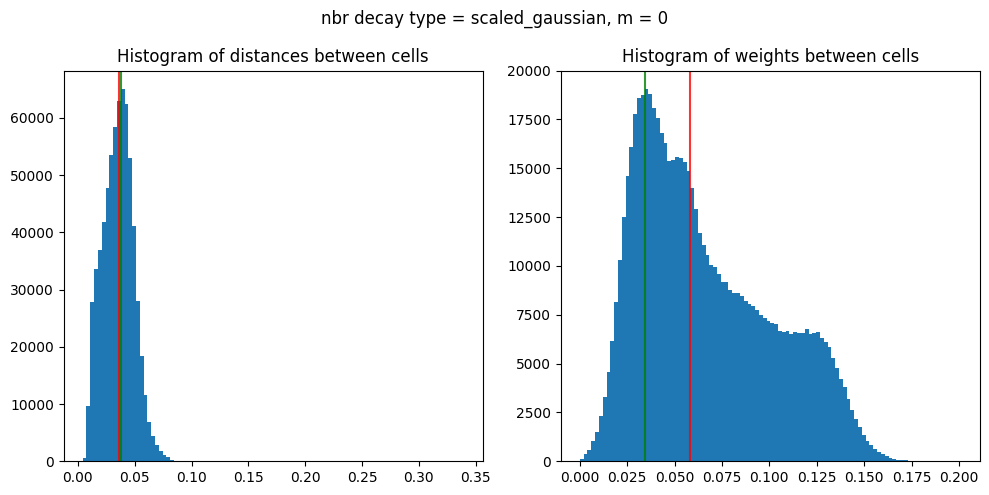

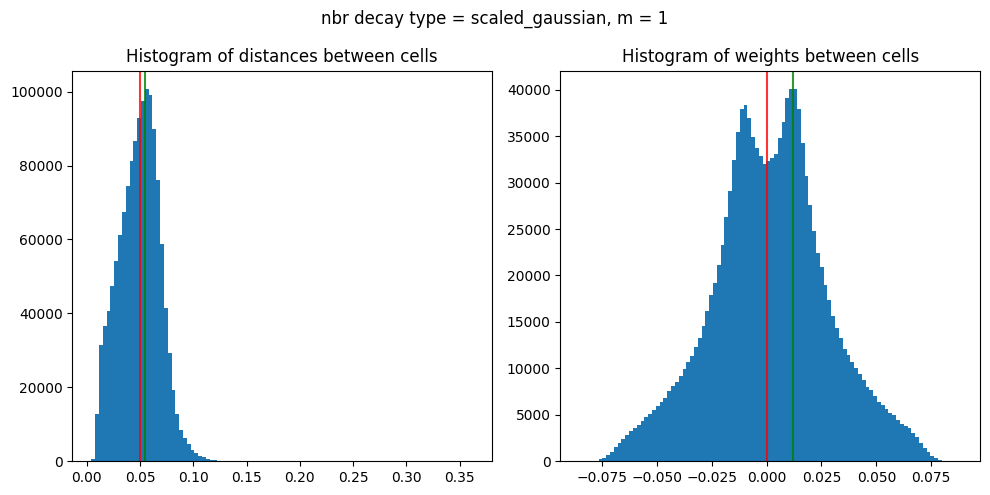

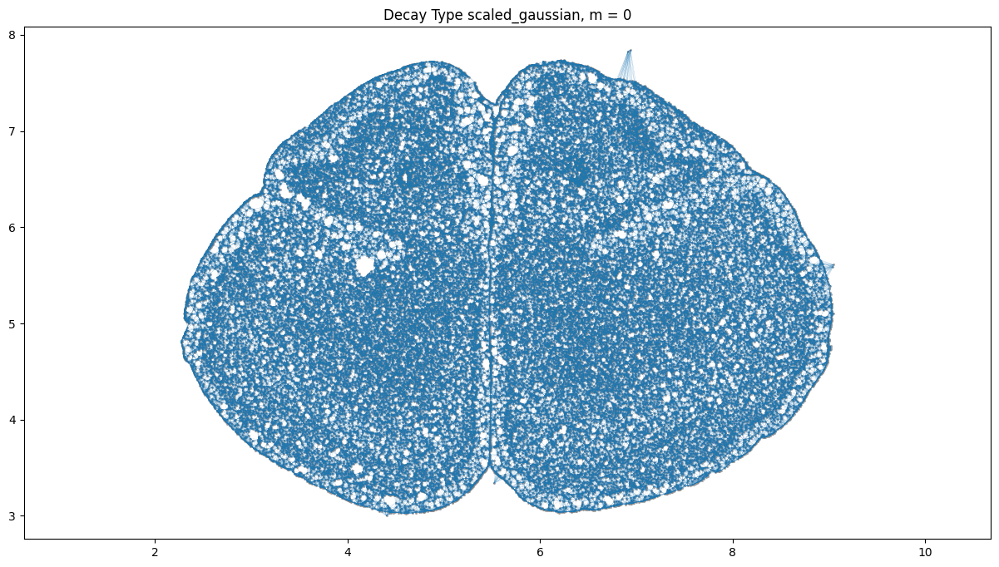

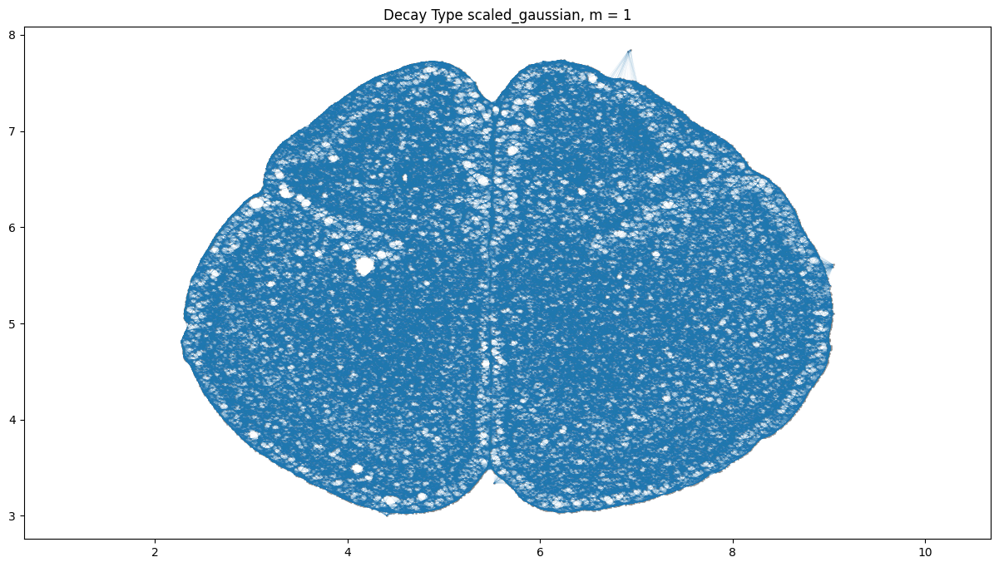

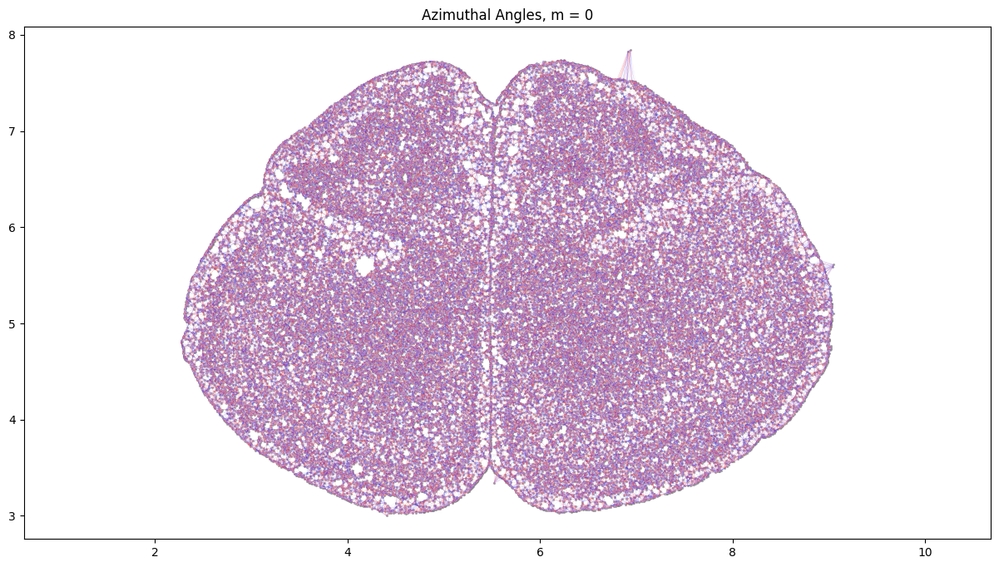

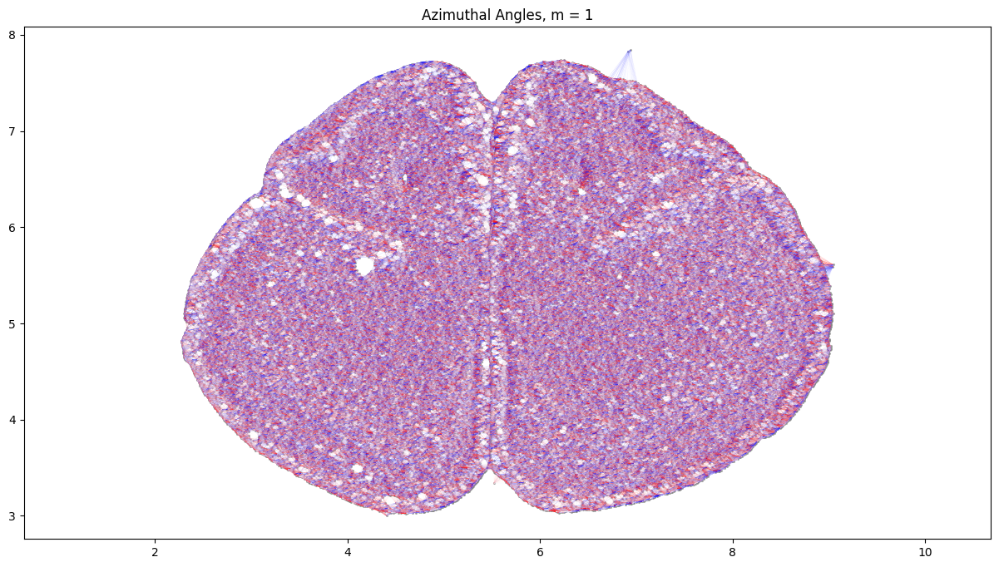

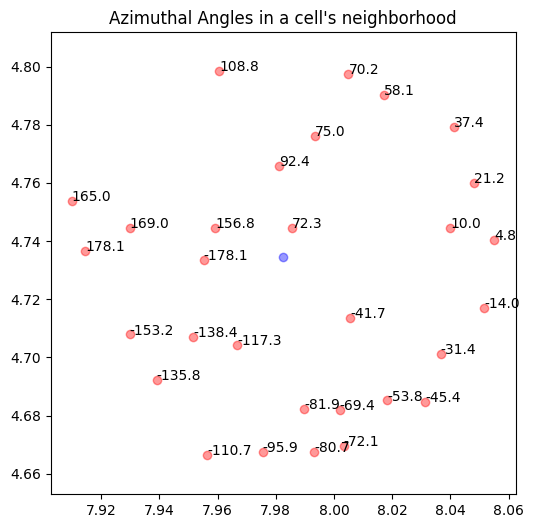

In [8]:
banksy_dict = initialize_banksy(
    adata,
    coord_keys,
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=True,
    plt_theta=True,
)

In [9]:
banksy_dict, banksy_matrix = generate_banksy_matrix(adata,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)

Runtime May-08-2024-19-17

550 genes to be analysed:
Gene List:
Index(['ENSMUSG00000026778', 'ENSMUSG00000026837', 'ENSMUSG00000001985',
       'ENSMUSG00000039323', 'ENSMUSG00000048387', 'ENSMUSG00000027849',
       'ENSMUSG00000033063', 'ENSMUSG00000030226', 'ENSMUSG00000020902',
       'ENSMUSG00000021685',
       ...
       'Blank-16', 'Blank-32', 'Blank-18', 'Blank-4', 'Blank-28', 'Blank-33',
       'Blank-34', 'Blank-45', 'Blank-23', 'Blank-48'],
      dtype='object', name='gene_identifier', length=550)

Check if X contains only finite (non-NAN) values
Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <44699x44699 sparse matrix of type '<class 'numpy.float64'>'
	with 670485 stored elements in Compressed Sparse Row format>, 1: <44699x44699 sparse matrix of type '<class 'numpy.complex128'>'
	with 1340970 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 1.82 | Std: 6.0
Size of Nbr | Shape: (44699, 550)
Top 3 entries of Nbr Mat:

[[0.30181836 0.0907074

# Append Non-spatial results to the banksy_dict for comparsion


In [10]:
banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

print(banksy_dict['nonspatial'][0.0]['adata'])

Scale factors squared: [1.]
Scale factors: [1.]
AnnData object with n_obs × n_vars = 44699 × 550
    obs: 'brain_section_label', 'cluster', 'domain', 'nico_ct', 'x', 'y'
    var: 'gene_symbol', 'transcript_identifier', 'is_nbr', 'k'


# Reduce dimensions of each data matrix
We utilize two common methods for dimensionality reduction:

PCA (using scikit-learn), we reduce the size of the matrix from 
 to pca_dims. As a default settings, we reduce to 20 dimensions.
UMAP (UMAP package), which we use to visualize expressions of clusters in the umap space (2-D space).

In [11]:
pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True,
         plt_remaining_var = False,
         )

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.8)

Setting the total number of PC = 20
Original shape of matrix: (44699, 1650)
Reduced shape of matrix: (44699, 20)
------------------------------------------------------------
min_value = -20.01175809675716, mean = 1.7715641452721566e-15, max = 25.879742120699447

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_20_umap"]
UMAP embedding
------------------------------------------------------------
shape: (44699, 2)


AxisArrays with keys: reduced_pc_20, reduced_pc_20_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 20
Original shape of matrix: (44699, 550)
Reduced shape of matrix: (44699, 20)
------------------------------------------------------------
min_value = -22.082797953015312, mean = -1.1136981252721813e-14, max = 39.68479367765462

Conducting UMAP and adding embeddings to adata.obsm["reduc

# Cluster cells using a partition algorithm
For the purpose of this dataset, we cluster cells using the leiden algorithm (use !pip install leidenalg if package missing) partition methods. Other clustering algorithms include louvain (another resolution based clustering algorithm), or mclust (a clustering based on gaussian mixture model).

Note that by default, we recommend resolution-based clustering (i.e., leiden or louvain) if no prior information on the number of clusters known. However, if the number of clusters is known a priori, the user can use mclust (gaussian-mixture model) by specifying the number of clusters beforehand.

In [12]:
seed=123456
results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50,
    num_iterations = -1,
    partition_seed = seed,
    match_labels = True,
)

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.8
reduced_pc_20 

reduced_pc_20_umap 

PCA dims to analyse: [20]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.8, PCA dimensions = 20)


Nearest-neighbour weighted graph (dtype: float64, shape: (44699, 44699)) has 2234950 nonzero entries.
---- Ran find_nn in 59.20 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (44699, 44699)) has 2234950 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 34485041 to 2233358.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (44699, 44699)) has 2157884 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (44699, 44699)) has 2157884 nonzero entries.

sNN graph data:
[19  6  8 ...  7  6  5]

---- Ran shared_nn in 2.64 s ----


-- Multiplying sNN connectivity by weights -

,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc20_nc0.00_r0.90,nonspatial,0.0,20,0.9,21,"Label object:\nNumber of labels: 21, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 21, number of..."
scaled_gaussian_pc20_nc0.80_r0.90,scaled_gaussian,0.8,20,0.9,15,"Label object:\nNumber of labels: 15, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 15, number of..."


# Plot results
Visualize the clustering results from BANKSY, including the clusters from the Umap embbedings

Saving figure at ./tmp_aba/tmp_png/slideseq_mousecerebellum_nonspatial_pc20_nc0.00_r0.90_spatialmap.png
number of labels: 21
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 21
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 21
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((21, 44699) x (44699, 44699) x (44699, 21))

Saving figure at ./tmp_aba/tmp_png/slideseq_mousecerebellum_scaled_gaussian_pc20_nc0.80_r0.90_spatialmap.png
number of labels: 15
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 15
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 15
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((15, 44699) x (44699, 44699) x (44699, 15))



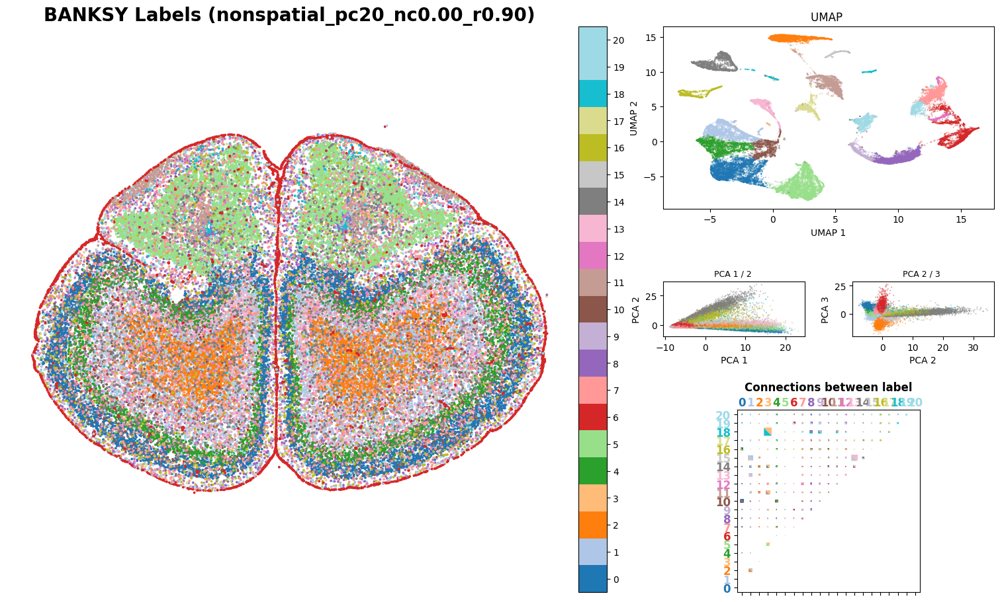

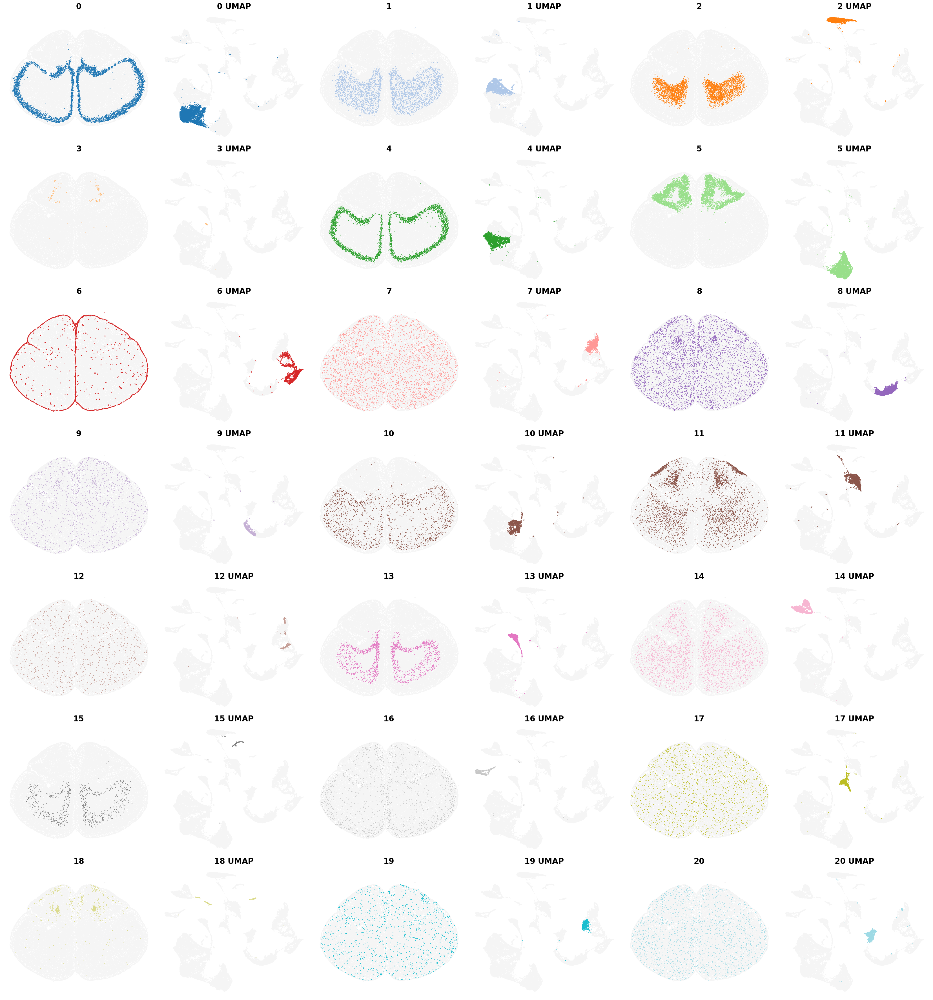

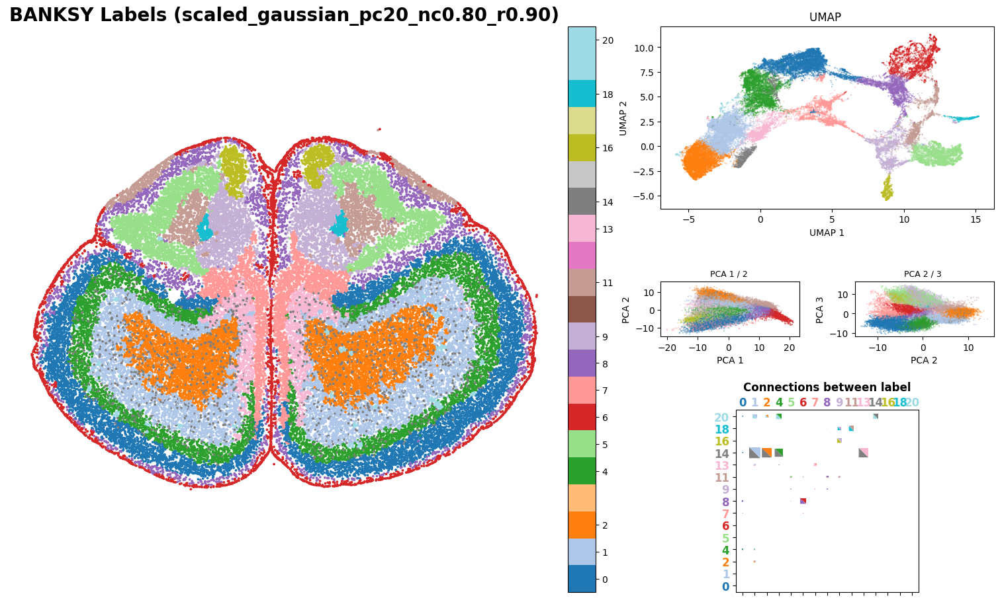

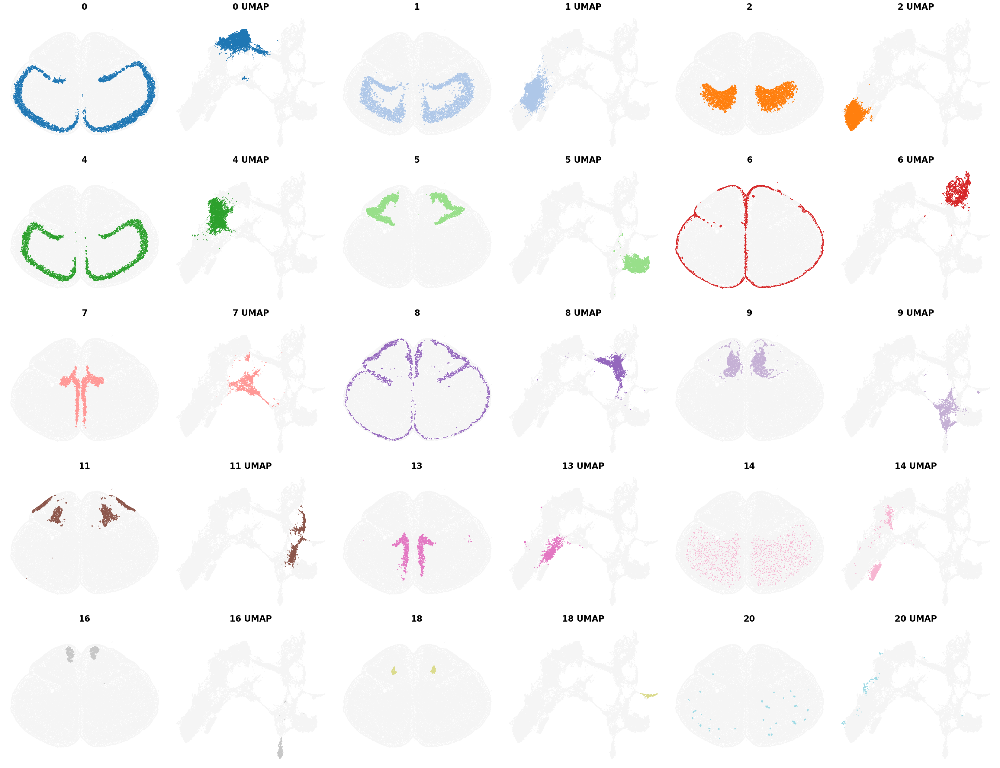

In [13]:

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    save_path = os.path.join(output_folder, 'tmp_png'),
    save_fig = True, # save the spatial map of all clusters
    save_seperate_fig = True, # save the figure of all clusters plotted seperately
)

In [14]:
print(banksy_dict['scaled_gaussian'].keys())
print(banksy_dict['nonspatial'].keys())

dict_keys(['weights', 'norm_counts_concatenated', 0.8])
dict_keys([0.0])


In [14]:
banksy_dict['scaled_gaussian']['weights']

{0: <375160x375160 sparse matrix of type '<class 'numpy.float64'>'
 	with 5627400 stored elements in Compressed Sparse Row format>,
 1: <375160x375160 sparse matrix of type '<class 'numpy.complex128'>'
 	with 11254800 stored elements in Compressed Sparse Row format>}

In [15]:
banksy_dict['scaled_gaussian']['norm_counts_concatenated'].shape

(375160, 1026)

In [16]:
banksy_dict['scaled_gaussian'][0.8]

KeyError: 0.8

In [ ]:
banksy_dict['scaled_gaussian'][0.2]

In [ ]:
banksy_dict['nonspatial'][0.0]['adata']

In [15]:
A=banksy_dict['nonspatial'][0.0]['adata'].obs['labels_nonspatial_pc20_nc0.00_r0.90']
#B=banksy_dict['scaled_gaussian'][0.2]['adata'].obs['labels_scaled_gaussian_pc20_nc0.20_r0.90']
C=banksy_dict['scaled_gaussian'][0.8]['adata'].obs['labels_scaled_gaussian_pc20_nc0.80_r0.90']
A.to_csv(output_folder+'nonspatial_L0.csv')
#B.to_csv(output_folder+'SG_L02.csv')
C.to_csv(output_folder+'SG_L08.csv')

In [17]:
x=banksy_dict['nonspatial'][0.0]['adata']
x.write_h5ad('nonspatial.h5ad')
y=banksy_dict['scaled_gaussian'][0.8]['adata']
y.write_h5ad('scaled_gaussian_08.h5ad')

In [18]:

end_time = time.time()  # End time
memory_after = memory_usage()[0]  # Memory after execution
execution_time = end_time - start_time  # Execution time
memory_used = memory_after - memory_before  # Memory used
print("execution_time, memory_used")
print(execution_time, memory_used)

execution_time, memory_used
2215.866056203842 5000.0703125


In [ ]:
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]


In [ ]:
results_df['labels']

In [ ]:

annotation_key='nico_ct'
results_df = run_banksy_multiparam(
    adata,
    banksy_dict,
    lambda_list,
    resolutions,
    color_list = spagcn_color,
    max_m = max_m,
    filepath = output_folder,
    key = coord_keys,
    pca_dims = pca_dims,
    annotation_key = annotation_key,
    max_labels = num_clusters,
    cluster_algorithm = cluster_algorithm,
    match_labels = False,
    savefig = True,
    add_nonspatial = False,
    variance_balance = False,
)


In [ ]:
results_df

In [ ]:
from banksy_utils.refine_clusters import refine_clusters

results_df = refine_clusters(adata,
                             results_df,
                             coord_keys=coord_keys,
                             color_list=spagcn_color,
                             savefig=True,
                             output_folder=output_folder,
                             refine_method='once',
                             annotation_key=annotation_key,
                             num_neigh=6)

run_time = (time.perf_counter_ns() - start) * 1e-9
print(f"BANKSY runtime = {round(run_time / 60, 3)} mins")
results_df.to_csv(os.path.join(output_folder, 'results.csv'))

In [ ]:
from banksy.cluster_methods import run_Leiden_partition

results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50,
    num_iterations = -1,
    partition_seed = seed,
    match_labels = True,
)